In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from scipy import stats


df = pd.read_csv('BDAA_Project_ImportantColumns.csv')
df.info(verbose=True)
df


FileNotFoundError: [Errno 2] No such file or directory: 'BDAA_Project_ImportantColumns.csv'

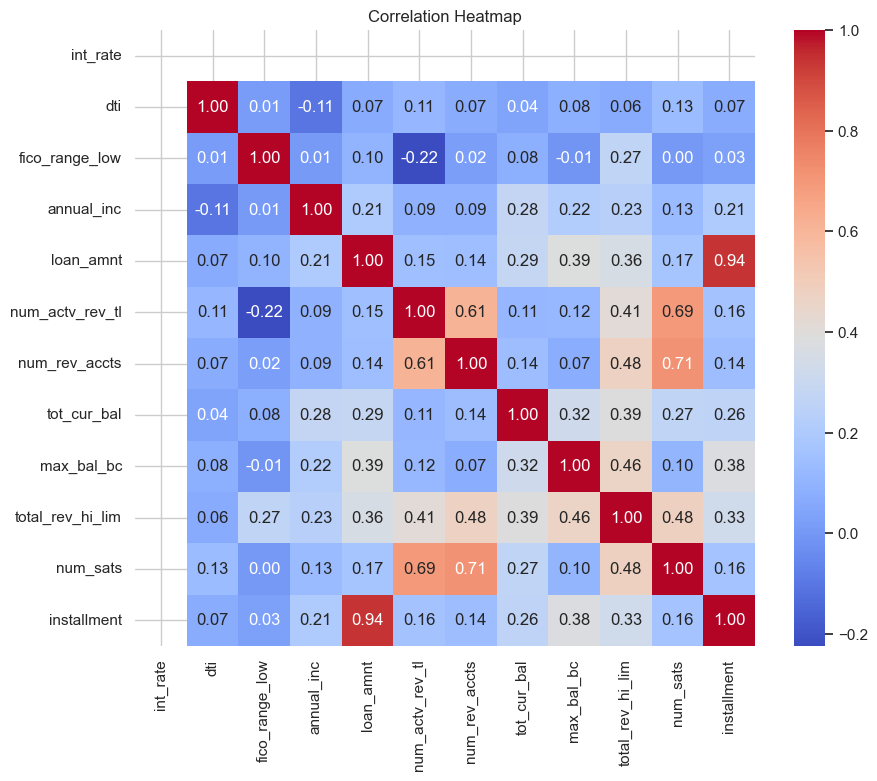

In [149]:
#Correlation HeatMap

# Select relevant columns
selected_columns = df[['int_rate', 'dti', 'fico_range_low', 'annual_inc', 'loan_amnt','num_actv_rev_tl','num_rev_accts',
                       'tot_cur_bal', 'max_bal_bc', 'total_rev_hi_lim', 'num_sats','installment',]]

# Drop rows with missing values
selected_columns = selected_columns.dropna()

# Ensure all columns are numeric (just in case)
selected_columns = selected_columns.apply(pd.to_numeric, errors='coerce')

# Compute correlation matrix
corr = selected_columns.corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()


In [150]:
#USA MAP


# Group by state abbreviation (assuming your column for states is named 'addr_state')
state_counts = df.groupby("addr_state").size().reset_index(name="count")

# Create a choropleth map with a custom color scale from blue to purple to red
fig = px.choropleth(
    state_counts,
    locations="addr_state",  # The column that holds state abbreviations
    locationmode="USA-states",  # Specifies that we're using USA states
    color="count",  # The column with the counts of people per state
    color_continuous_scale=["lightblue", "purple", "#800000"],  # Custom color scale
    scope="usa",  # Limit the map to the USA
    labels={'count': 'Total People'},  # Label for the color legend
)

# Customize the map appearance
fig.update_layout(
    title_text="Total People per State",
    geo=dict(
        showcoastlines=True,  # Show coastline outlines
        coastlinecolor="Black",  # Coastline color
        showland=True,  # Show land areas
        landcolor="lightgray",  # Land color
    )
)

# Show the map
fig.show()


In [151]:
#Creates a 5 year interval

df['numeric_column'] = df['earliest_cr_line'].str.replace(r'\D', '', regex=True)

# Loop through the values and adjust the year
for index, year in enumerate(df['numeric_column']):
    int_year = int(year)
    if pd.notna(year):  # Check if the value is not NaN
        if int_year < 29:
            df.at[index, 'numeric_column'] = 2000 + int_year
        else:
            df.at[index, 'numeric_column'] = 1900 + int_year

# Define year intervals (e.g., every 5 years)
def get_year_interval(year):
    start_year = (year // 5) * 5  # Find the starting year of the interval
    end_year = start_year + 4     # The end year of the interval
    return f'{start_year}-{end_year}'

# Apply the function to create year intervals
df['year_interval'] = df['numeric_column'].apply(get_year_interval)

# Count the values in each year interval
interval_counts = df['year_interval'].value_counts().reset_index()
interval_counts.columns = ['Year Interval', 'Count']

# Create a pie chart
fig = px.pie(
    interval_counts,
    names='Year Interval',
    values='Count',
    title='Distribution of Data Across Year Intervals'
)

fig.show()


In [152]:
import pandas as pd
import plotly.express as px

# Ensure loan amount is numeric
df['loan_amnt'] = pd.to_numeric(df['loan_amnt'], errors='coerce')

# Drop rows with missing relevant data
df_clean = df[['year_interval', 'loan_amnt']].dropna()

# Group by year interval
interval_stats = df_clean.groupby('year_interval').agg(
    total_amount=('loan_amnt', 'sum'),
    average_per_person=('loan_amnt', 'mean'),
    count=('loan_amnt', 'count')
).reset_index()

# Filter out intervals starting before 1975
interval_stats = interval_stats[interval_stats['year_interval'].apply(lambda x: int(x.split('-')[0]) >= 1975)]

print(interval_stats)

# Plot total loan amount
fig = px.bar(
    interval_stats,
    x='year_interval',
    y='total_amount',
    title='Total Loan Amount by 5-Year Interval (1975 and later)',
    labels={'total_amount': 'Total Loan Amount ($)', 'year_interval': 'Year Interval'},
    template='plotly_white'
)
fig.show()

# Plot average loan amount per person
fig_avg = px.bar(
    interval_stats,
    x='year_interval',
    y='average_per_person',
    title='Average Loan Amount per Person by 5-Year Interval (1975 and later)',
    labels={'average_per_person': 'Average Loan Amount ($)', 'year_interval': 'Year Interval'},
    template='plotly_white'
)
fig_avg.show()




   year_interval  total_amount  average_per_person   count
6      1975-1979      95148325        17768.127918    5355
7      1980-1984     210634825        18368.782157   11467
8      1985-1989     476477400        18600.772954   25616
9      1990-1994     797674100        18579.509934   42933
10     1995-1999    1547648850        18170.650910   85173
11     2000-2004    2810297950        17531.381276  160301
12     2005-2009    3299181850        15824.780317  208482
13     2010-2014    1400113175        13653.380157  102547
14     2015-2019     217485650        11193.291302   19430


In [153]:
# Extract the starting year from 'year_interval' and convert it to integer
df['start_year'] = df['year_interval'].apply(lambda x: int(x.split('-')[0]))

# Filter out any rows where the start year is before 1965
df_filtered_years = df[df['start_year'] >= 1975]

# Group by 'year_interval' and 'purpose' and count the occurrences
purpose_distribution = df_filtered_years.groupby(['year_interval', 'purpose']).size().reset_index(name='count')

# Create a stacked bar chart showing the distribution of purposes across 5-year intervals
fig = px.bar(
    purpose_distribution,
    x='year_interval',
    y='count',
    color='purpose',
    title='Loan Purpose Distribution Over 5 Year Intervals (Post 1965)',
    labels={'count': 'Number of Loans'},
    category_orders={'year_interval': sorted(df_filtered_years['year_interval'].unique())},  # Sort year intervals for clarity,
    

)

fig.show()

In [154]:
import plotly.express as px
import pandas as pd

# Assuming df is already defined, and you have the 'year_interval' and 'purpose' columns.

# Extract the starting year from 'year_interval' and convert it to integer
df['start_year'] = df['year_interval'].apply(lambda x: int(x.split('-')[0]))

# Filter out any rows where the start year is before 1975
df_filtered_years = df[df['start_year'] >= 1975]

# Group by 'year_interval' and 'purpose' and count the occurrences
purpose_distribution = df_filtered_years.groupby(['year_interval', 'purpose']).size().reset_index(name='count')

# Normalize the counts by dividing by the total count for each year_interval
purpose_distribution['normalized_count'] = purpose_distribution.groupby('year_interval')['count'].transform(lambda x: x / x.sum())

# Create a segmented bar chart with normalized values (stacked)
fig = px.bar(
    purpose_distribution,
    x='year_interval',
    y='normalized_count',  # This is the normalized value
    color='purpose',
    title='Loan Purpose Distribution Over 5 Year Intervals (Post 1975)',
    labels={'normalized_count': 'Proportion of Loans'},
    category_orders={'year_interval': sorted(df_filtered_years['year_interval'].unique())},  # Sort year intervals for clarity
    barmode='stack'  # Stack the segments
)

fig.show()


In [155]:
from scipy.stats import ttest_ind
import pandas as pd



# Filter purposes
purposes = ['credit_card', 'home_improvement', 'debt_consolidation']

# Create subsets
credit_card_rates = df[df['purpose'] == 'credit_card']['int_rate'].dropna()
home_improvement_rates = df[df['purpose'] == 'home_improvement']['int_rate'].dropna()
debt_consolidation_rates = df[df['purpose'] == 'debt_consolidation']['int_rate'].dropna()

# Run t-tests
print("Credit Card vs Home Improvement")
t1, p1 = ttest_ind(credit_card_rates, home_improvement_rates, equal_var=False)
print(f"t = {t1:.3f}, p = {p1:.3f}\n")

print("Credit Card vs Debt Consolidation")
t2, p2 = ttest_ind(credit_card_rates, debt_consolidation_rates, equal_var=False)
print(f"t = {t2:.3f}, p = {p2:.3f}\n")

print("Home Improvement vs Debt Consolidation")
t3, p3 = ttest_ind(home_improvement_rates, debt_consolidation_rates, equal_var=False)
print(f"t = {t3:.3f}, p = {p3:.3f}")


Credit Card vs Home Improvement


TypeError: unsupported operand type(s) for /: 'str' and 'int'

In [ ]:
#Purpose of the loan and intrest rate

# Group by the 'purpose' column and calculate the average FICO score
purpose_fico = df.groupby('purpose')['int_rate'].mean().reset_index()

print(purpose_fico.corr)
purpose_fico_sorted = purpose_fico.sort_values(by='int_rate', ascending=False)

fig = px.bar(
    purpose_fico_sorted,
    x='purpose',
    y='int_rate',
    title='Average Intrest Rate by Loan Purpose',
    labels={'int_rate': 'Average Interest Rate'},
)
fig.show()

<bound method DataFrame.corr of                purpose   int_rate
0                  car  12.966525
1          credit_card  11.803885
2   debt_consolidation  13.273225
3     home_improvement  12.636517
4                house  13.262190
5       major_purchase  13.188116
6              medical  14.019864
7               moving  14.146821
8                other  13.819646
9     renewable_energy  13.219689
10      small_business  13.663145
11            vacation  14.105853>


In [ ]:
#Annual income per loan type
# Drop rows with missing values in 'annual_inc' or 'purpose'
df_clean = df[['annual_inc', 'purpose']].dropna()

# Group by 'purpose' and calculate mean income
mean_income_by_purpose = df_clean.groupby('purpose')['annual_inc'].mean().reset_index()

# Sort by income for better visualization
mean_income_by_purpose = mean_income_by_purpose.sort_values(by='annual_inc', ascending=False)

# Create bar chart
fig = px.bar(
    mean_income_by_purpose,
    x='purpose',
    y='annual_inc',
    title='Mean Annual Income by Loan Purpose',
    labels={'annual_inc': 'Mean Annual Income', 'purpose': 'Loan Purpose'},
    color_discrete_sequence=['royalblue']
)

# Improve layout
fig.update_layout(xaxis_tickangle=-45)

fig.show()


In [ ]:
#States Average intrest rate
import pandas as pd
import plotly.express as px

# Remove '%' and convert to float, if necessary
#df['int_rate'] = df['int_rate'].astype(str).str.rstrip('%').astype(float)

df_clean = df[['addr_state', 'int_rate']].dropna()

# Group by state and calculate mean interest rate
state_avg_rates = df_clean.groupby('addr_state', as_index=False)['int_rate'].mean()

# Calculate median interest rate
median_rate = state_avg_rates['int_rate'].median()

# Create vertical bar chart
fig = px.bar(
    state_avg_rates,
    x='addr_state',
    y='int_rate',
    orientation='v',
    labels={'int_rate': 'Average Interest Rate (%)', 'addr_state': 'State'},
    title='Average Interest Rates by State (with Median Line)'
)

# Add median vertical line
fig.add_hline(
    y=median_rate,
    line_dash="dash",
    line_color="red",
    annotation_text=f"Median: {median_rate:.2f}%",
    annotation_position="top right"
)

# Update layout
fig.update_layout(
    template='plotly_white',
    xaxis=dict(categoryorder='total ascending')
)

fig.show()



In [ ]:
#States Annual income
import pandas as pd
import plotly.express as px

# Drop missing values
df_clean = df[['addr_state', 'annual_inc']].dropna()

# Group by state and calculate median annual income
state_incomes = df_clean.groupby('addr_state', as_index=False)['annual_inc'].median()

# Sort states by median income
state_incomes = state_incomes.sort_values(by='annual_inc', ascending=True)

# Calculate national median income
median_income = state_incomes['annual_inc'].median()

# Create vertical bar chart
fig = px.bar(
    state_incomes,
    x='addr_state',
    y='annual_inc',
    orientation='v',
    labels={'annual_inc': 'Median Annual Income', 'addr_state': 'State'},
    title='Median Annual Income by State (with National Median Line)'
)

# Add horizontal line for national median income
fig.add_hline(
    y=median_income,
    line_dash="dash",
    line_color="red",
    annotation_text=f"Median: ${median_income:,.0f}",
    annotation_position="top right"
)

# Update layout
fig.update_layout(
    template='plotly_white',
    xaxis=dict(categoryorder='total ascending')
)

fig.show()

print(state_incomes)


   addr_state  annual_inc
28         NE     60000.0
2          AR     60000.0
25         MT     60000.0
40         SD     60000.0
12         ID     60000.0
45         VT     63000.0
20         ME     63000.0
23         MO     64000.0
16         KY     64395.5
24         MS     65000.0
27         ND     65000.0
48         WV     65000.0
34         OH     65000.0
36         OR     65000.0
15         KS     65000.0
9          FL     65000.0
41         TN     65000.0
47         WI     65000.0
14         IN     65000.0
21         MI     66000.0
26         NC     66000.0
39         SC     66375.0
3          AZ     67000.0
1          AL     67000.0
31         NM     67000.0
32         NV     67350.0
37         PA     68000.0
35         OK     68000.0
22         MN     68003.5
38         RI     70000.0
43         UT     70000.0
49         WY     70000.0
17         LA     70000.0
29         NH     71000.0
5          CO     72000.0
11         HI     72000.0
8          DE     72000.0
10         G

In [ ]:
#Pie Charts of Types of Loans
diff_times = df.groupby('term')['int_rate']
print(diff_times)

diff_times_mean = df.groupby('term')['int_rate'].mean()
print(diff_times_mean)

# Clean whitespace from the 'term' column
df['term'] = df['term'].str.strip()

# Filter rows directly based on 'term'
df_36 = df[df['term'] == '36 months']
df_60 = df[df['term'] == '60 months']

# Make sure 'purpose' column exists in filtered DataFrames
print("Columns in df_36:", df_36.columns)
print("Columns in df_60:", df_60.columns)

# PIE CHART for 36-month loans
fig_36 = px.pie(
    df_36,
    names='purpose',
    title='Loan Purpose Distribution (36-month loans)'
)

# PIE CHART for 60-month loans
fig_60 = px.pie(
    df_60,
    names='purpose',
    title='Loan Purpose Distribution (60-month loans)'
)

fig_36.show()
fig_60.show()


term
36 months    12.099413
60 months    14.540924
Name: int_rate, dtype: float64
Columns in df_36: Index(['loan_amnt', 'funded_amnt', 'int_rate', 'installment', 'grade',
       'sub_grade', 'term', 'annual_inc', 'purpose', 'dti', 'earliest_cr_line',
       'fico_range_low', 'fico_range_high', 'tot_cur_bal',
       'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_actv_rev_tl',
       'num_bc_sats', 'num_bc_tl', 'num_il_tl', 'num_op_rev_tl',
       'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats', 'num_tl_120dpd_2m',
       'addr_state', 'earliest_cr_line.1', 'il_util', 'total_bal_il',
       'max_bal_bc', 'total_rev_hi_lim'],
      dtype='object')
Columns in df_60: Index(['loan_amnt', 'funded_amnt', 'int_rate', 'installment', 'grade',
       'sub_grade', 'term', 'annual_inc', 'purpose', 'dti', 'earliest_cr_line',
       'fico_range_low', 'fico_range_high', 'tot_cur_bal',
       'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_actv_rev_tl',
       'num_bc_sats', 'num_bc_tl', 'num_il_tl'

85735.11734394652
87514.56550372075
t-statistic: -6.7019229430288
p-value: 2.0586030379103152e-11


/var/folders/2j/xtwf217j69zd4c401c_dmb2c0000gn/T/ipykernel_41971/727770996.py:34: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




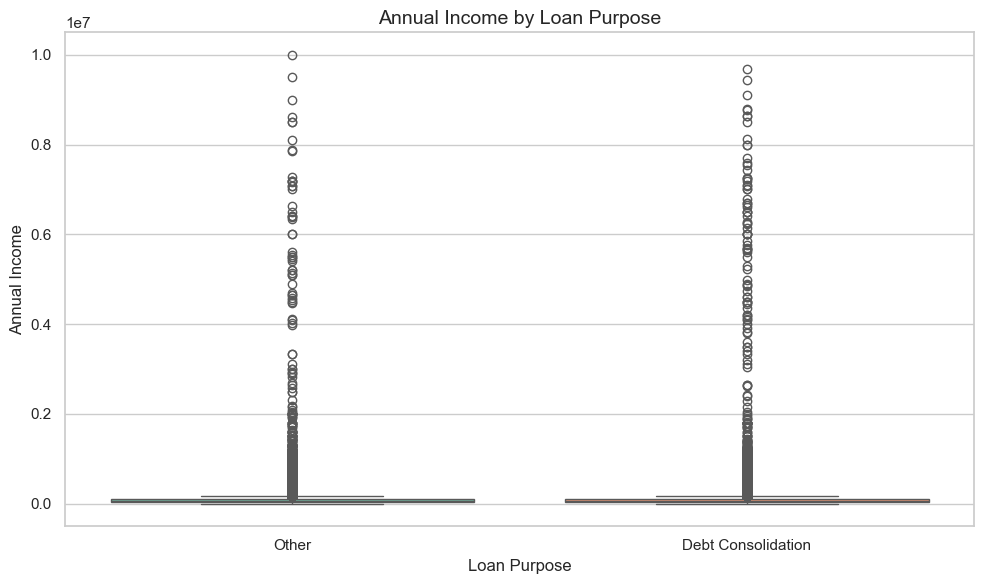

In [ ]:
#Annual Income to more likely to do debt consolidation

# Clean whitespace if needed
df['purpose'] = df['purpose'].str.strip()

# Split into two groups
income_debt = df[df['purpose'] == 'debt_consolidation']['annual_inc']
income_other = df[df['purpose'] != 'debt_consolidation']['annual_inc']

# Drop any missing values just in case
income_debt = income_debt.dropna()
income_other = income_other.dropna()

print(income_debt.median())
print(income_other.median())

# Run two-sample t-test (assume unequal variances)
t_stat, p_val = stats.ttest_ind(income_debt, income_other, equal_var=False)

print("t-statistic:", t_stat)
print("p-value:", p_val)

# Create a new column to label the group
df['loan_type'] = df['purpose'].apply(
    lambda x: 'Debt Consolidation' if x == 'debt_consolidation' else 'Other'
)

# Drop missing income values
filtered_df = df.dropna(subset=['annual_inc'])

# Set plot style
sns.set(style="whitegrid")

# Create the box-and-whisker plot
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=filtered_df,
    x='loan_type',
    y='annual_inc',
    palette='Set2',
    showfliers=True,  # Show outliers as individual points
)

# Add title and axis labels
plt.title('Annual Income by Loan Purpose', fontsize=14)
plt.xlabel('Loan Purpose')
plt.ylabel('Annual Income')

# Show the plot
plt.tight_layout()
plt.show()


t-statistic: nan
p-value: nan
